<a href="https://colab.research.google.com/github/sswoo333/2022-1-capstone2-ssw/blob/main/Detectron2_Car_5k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

초기환경설정

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html
#install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 33.8 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=341cbd587a87a1d25d62d33520efc374978a17713f4e7056629822164e33334b
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5 MB 15 kB/s 
     |████████████████████████████████| 17.3 MB 22.0 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0+cu113
    Uninstalling torch-1.11.0+cu113

In [ ]:
 !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
 # After this setp it will ask you to restart the runtime, please do it 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.3 MB 559 kB/s 
     |████████████████████████████████| 50 kB 4.6 MB/s 
     |████████████████████████████████| 79 kB 7.4 MB/s 
     |████████████████████████████████| 151 kB 15.0 MB/s 
     |████████████████████████████████| 130 kB 60.6 MB/s 
     |████████████████████████████████| 843 kB 58.7 MB/s 
     |████████████████████████████████| 749 kB 61.9 MB/s 
     |████████████████████████████████| 117 kB 72.2 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=b4451ce80e4ef63694cc50b78be03bebf71c043515c4385519df520c62bc8109
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9

In [ ]:
import torch
import torchvision
import cv2

utils.py

In [ ]:
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer
from detectron2.config import get_cfg
from detectron2 import model_zoo

from detectron2.utils.visualizer import ColorMode

import random 
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

#####
from detectron2.engine import HookBase
from detectron2.data import build_detection_train_loader
import detectron2.utils.comm as comm
#####

def plot_samples(dataset_name, n=1):
    dataset_custom = DatasetCatalog.get(dataset_name)
    dataset_custom_metadata = MetadataCatalog.get(dataset_name)

    for s in random.sample(dataset_custom, n):
        img = cv2.imread(s["file_name"])
        v = Visualizer(img[:,:,::-1], metadata=dataset_custom_metadata, scale=1)
        v = v.draw_dataset_dict(s)
        plt.figure(figsize=(14,10))
        plt.imshow(v.get_image())
        plt.show()

def get_train_cfg(config_file_path, checkpoint_url, train_datasetname, test_dataset_name, num_classes, device, output_dir):
    cfg = get_cfg()

    cfg.merge_from_file(model_zoo.get_config_file(config_file_path))
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(checkpoint_url)
    cfg.DATASETS.TRAIN = (train_dataset_name,)
    cfg.DATASETS.TEST = (test_dataset_name,)  #  Validation 

    #####
    cfg.DATASETS.VAL = (test_dataset_name,)
    #####

    """cfg.TEST.EVAL_PERIOD = 100 # 1000 iteration 중에 100번마다 validation 수행 """

    cfg.DATALOADER.NUM_WORKERS = 1      # class의 개수 

    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.BASE_LR = 0.00025    # Learning rate
    cfg.SOLVER.MAX_ITER = 5000      # 학습횟수 iteration 
    cfg.SOLVER.STEPS = []

    cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes
    cfg.MODEL.DEVICE = device
    cfg.OUPUT_DIR = output_dir

    return cfg

#####


class ValidationLoss(HookBase):
    def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg.clone()
        self.cfg.DATASETS.TRAIN = cfg.DATASETS.VAL
        self._loader = iter(build_detection_train_loader(self.cfg))
        
    def after_step(self):
        data = next(self._loader)
        with torch.no_grad():
            loss_dict = self.trainer.model(data)
            
            losses = sum(loss_dict.values())
            assert torch.isfinite(losses).all(), loss_dict

            loss_dict_reduced = {"val_" + k: v.item() for k, v in 
                                 comm.reduce_dict(loss_dict).items()}
            losses_reduced = sum(loss for loss in loss_dict_reduced.values())
            if comm.is_main_process():
                self.trainer.storage.put_scalars(total_val_loss=losses_reduced, 
                                                 **loss_dict_reduced)
#####

def on_image(image_path, predictor) :
    im = cv2.imread(image_path)
    outputs = predictor(im)
    v = Visualizer(im[:,:,::-1], metadata={}, scale=1, instance_mode=ColorMode.SEGMENTATION)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    plt.figure(figsize=(14,10))
    plt.imshow(v.get_image())
    plt.show()

def on_video(videoPath, predictor):
    cap = cv2.VideoCapture(videoPath)
    if (cap.isOpened()==False):
        print("Error opening file....")
        return

    (success,image) = cap.read()
    while success:
        predictions = predictor(image)
        v = Visualizer(image[:,:,::-1], metadata={}, scale=1, instance_mode=ColorMode.SEGMENTATION)
        output = v.draw_instance_predictions(predictions["instances"].to("cpu"))

        cv2.imshow("Result", output.get_image()[:,:,::-1])

        key = cv2.waitKey(1) & 0xFF
        if key == ord("q"):
            break
        (success,image) = cap.read()


train.py

WARNING [06/08 18:23:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/08 18:23:23 d2.data.datasets.coco]: Loaded 298 images in COCO format from train.json


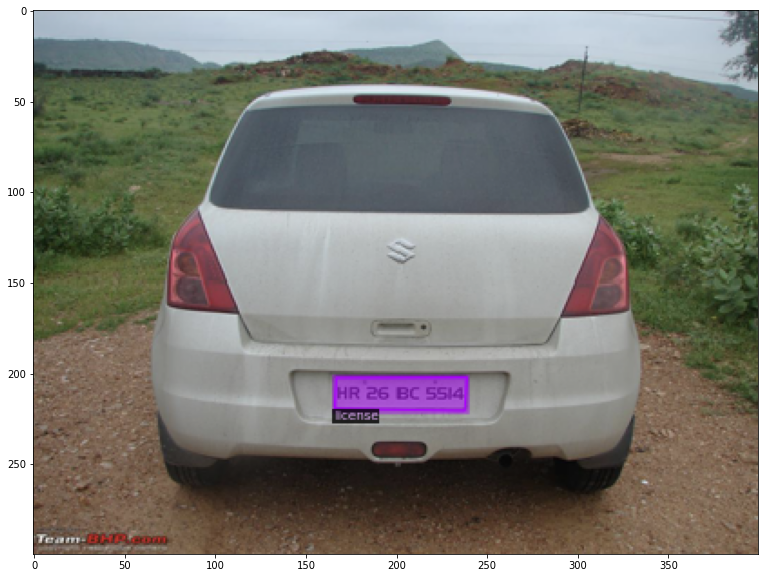

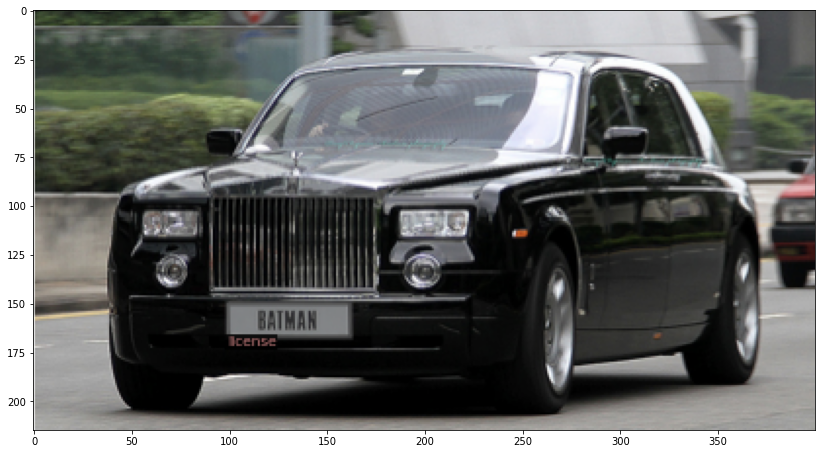

[06/08 18:23:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:11, 14.7MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[06/08 18:23:45 d2.engine.train_loop]: Starting training from iteration 0
[06/08 18:23:59 d2.utils.events]:  eta: 0:40:04  iter: 19  total_loss: 0.7728  loss_cls: 0.6645  loss_box_reg: 0.02884  loss_rpn_cls: 0.07982  loss_rpn_loc: 0.01931  total_val_loss: 0.8796  val_loss_cls: 0.6689  val_loss_box_reg: 0.02117  val_loss_rpn_cls: 0.1616  val_loss_rpn_loc: 0.01582  time: 0.4733  data_time: 0.0203  lr: 4.9953e-06  max_mem: 2729M
[06/08 18:24:12 d2.utils.events]:  eta: 0:37:51  iter: 39  total_loss: 0.7163  loss_cls: 0.5846  loss_box_reg: 0.02119  loss_rpn_cls: 0.1061  loss_rpn_loc: 0.01038  total_val_loss: 0.7492  val_loss_cls: 0.5858  val_loss_box_reg: 0.0232  val_loss_rpn_cls: 0.1725  val_loss_rpn_loc: 0.01406  time: 0.4589  data_time: 0.0098  lr: 9.9902e-06  max_mem: 2729M
[06/08 18:24:26 d2.utils.events]:  eta: 0:38:58  iter: 59  total_loss: 0.5287  loss_cls: 0.4588  loss_box_reg: 0.03494  loss_rpn_cls: 0.0397  loss_rpn_loc: 0.009456  total_val_loss: 0.6041  val_loss_cls: 0.4614  val_

In [ ]:
from detectron2.utils.logger import setup_logger

setup_logger()

from detectron2.data.datasets import register_coco_instances 
from detectron2.engine import DefaultTrainer


### 모델평가 관련
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader


import os
import pickle

#from utils import *

config_file_path = "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml" #COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml
checkpoint_url = "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"

output_dir = "./output/object_detection" 
num_classes = 1 

device = "cuda" # "cuda" or "cpu"

train_dataset_name = "LP_train"
train_images_path = "train"
train_json_annot_path = "train.json"

test_dataset_name = "LP_test"
test_images_path = "test"
test_json_annot_path = "test.json"

cfg_save_path = "OD_cfg.pickle"

##############################################

if train_dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(train_dataset_name)

if test_dataset_name in DatasetCatalog.list():
    DatasetCatalog.remove(test_dataset_name)

##################################################

register_coco_instances(name = train_dataset_name, metadata={},
json_file= train_json_annot_path, image_root=train_images_path)

register_coco_instances(name = test_dataset_name, metadata={},
json_file= test_json_annot_path, image_root=test_images_path)

plot_samples(dataset_name=train_dataset_name, n=2)

################################################

def main():
    cfg = get_train_cfg(config_file_path, checkpoint_url, train_dataset_name, test_dataset_name, num_classes, device, output_dir)

    with open(cfg_save_path, 'wb') as f :
        pickle.dump(cfg,f,protocol=pickle.HIGHEST_PROTOCOL)

    os.makedirs(cfg.OUTPUT_DIR,exist_ok=True)
    trainer = DefaultTrainer(cfg)
    #####
    val_loss = ValidationLoss(cfg)  
    trainer.register_hooks([val_loss])
    # swap the order of PeriodicWriter and ValidationLoss
    trainer._hooks = trainer._hooks[:-2] + trainer._hooks[-2:][::-1]
    #####
    
    trainer.resume_or_load(resume=False)

    trainer.train()  # 학습 시작 

    ### 모델 평가(mAP)
    evaluator = COCOEvaluator("LP_test", cfg, False, output_dir="./output/")
    val_loader = build_detection_test_loader(cfg, "LP_test")
    print(inference_on_dataset(trainer.model, val_loader, evaluator))  
    ###

if __name__ == '__main__' :
    main()
    
###################################################


# **TensorBoard** Loss function graph


In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

test.py

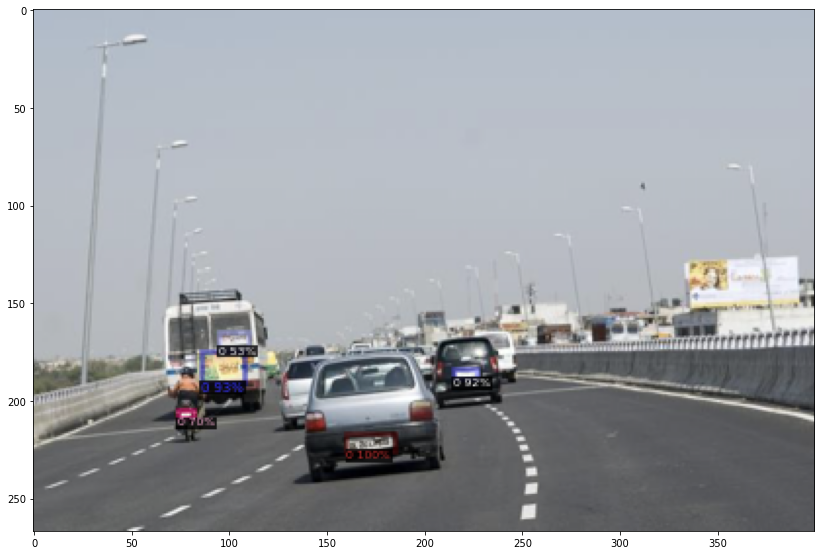

In [ ]:
from detectron2.engine import DefaultPredictor

import os
import pickle

#from utils import *

cfg_save_path = "OD_cfg.pickle"

with open(cfg_save_path,'rb') as f:
    cfg = pickle.load(f)

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

predictor = DefaultPredictor(cfg)

image_path = "test_L/Cars408.png"
#videoPath = "test/highway.mp4"

on_image(image_path, predictor)
#on_video(videoPath, predictor)



In [ ]:
#DownLoad Config File

f = open("config.yaml", "w")
f.write(cfg.dump())
f.close()